# Import packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from importlib import reload
%matplotlib inline
from matplotlib import rcParams
rcParams["axes.formatter.useoffset"] = False
rcParams['axes.formatter.limits'] = -15,15
rcParams['mathtext.fontset'] = 'stix'
rcParams['font.family'] = 'STIXGeneral'
rcParams['xtick.direction']='in'
rcParams['ytick.direction']='in'
#import sys
#sys.path.pop(0)

# Import rmfit

In [2]:
import rmfit
rmfit

GKS test: The py23 module has been deprecated and will be removed in a future release. Please update your code.


<module 'rmfit' from '/Users/gks/Dropbox/mypylib/notebooks/GIT/rmfit/__init__.py'>

### Read in 1 photometric and 1 RM transit from https://ui.adsabs.harvard.edu/abs/2022ApJ...931L..15S/abstract

Text(0, 0.5, 'Flux')

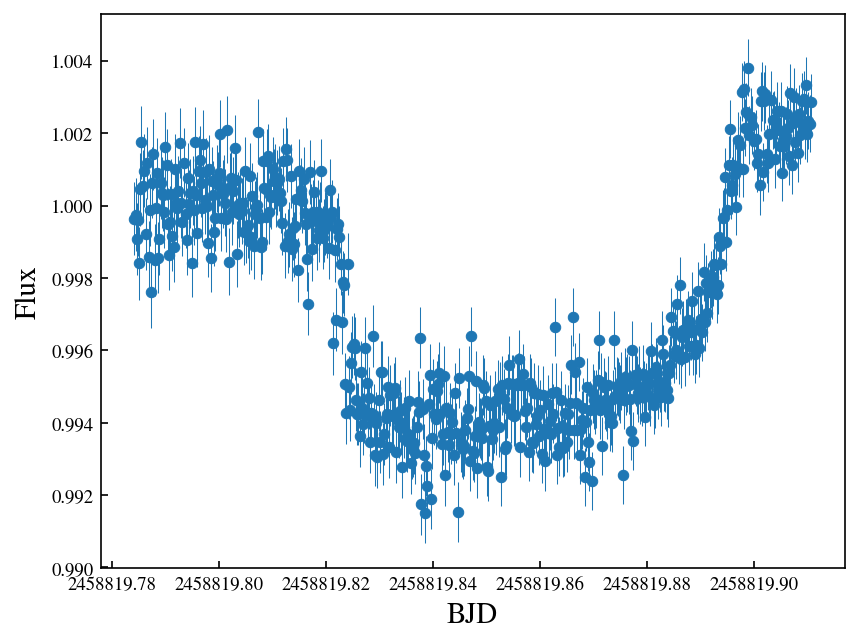

In [3]:
df_t = pd.read_csv('../data/example/05_gj3470/diffuser_transits_fig1ab.mrt',
                   skiprows=22,header=None,delim_whitespace=True,names=['bjd','f','e','model','gp','ntransit'])
df_t = df_t[df_t.ntransit ==1]
fig, ax = plt.subplots(dpi=150)
ax.errorbar(df_t.bjd.values,df_t.f.values,df_t.e.values,marker='o',lw=0,mew=0.5,capsize=0,elinewidth=0.5,)
ax.set_xlabel('BJD',fontsize=14)
ax.set_ylabel('Flux',fontsize=14)

Text(0, 0.5, 'RV [m/s]')

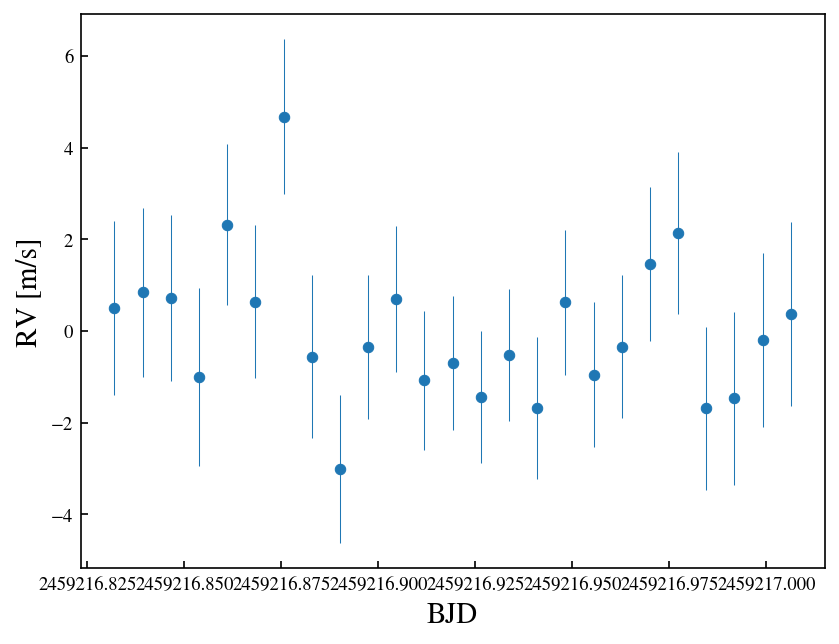

In [4]:
df_r = pd.read_csv('../data/example/05_gj3470/in_transit_rvs_fig1cd.mrt',
                   skiprows=19,header=None,delim_whitespace=True,names=['bjd','rv','e','ntransit'])
df_r = df_r[df_r.ntransit ==0]
fig, ax = plt.subplots(dpi=150)
ax.errorbar(df_r.bjd.values,df_r.rv.values,df_r.e.values,marker='o',lw=0,mew=0.5,capsize=0,elinewidth=0.5,)
ax.set_xlabel('BJD',fontsize=14)
ax.set_ylabel('RV [m/s]',fontsize=14)

# Read in prior file 

In [5]:
f = '../data/example/05_gj3470/gj3470_priors.dat'
inp = {}
inp['time_rv1'] = df_r.bjd.values
inp['rv_rv1']   = df_r.rv.values
inp['e_rv1']    = df_r.e.values
inp['time_tr1'] = df_t.bjd.values
inp['f_tr1']    = df_t.f.values
inp['e_tr1']    = df_t.e.values

L = rmfit.rmfit.LPFunction1RM1Phot(inp,f)
TF = rmfit.rmfit.RMFit(L)

Reading in priorfile from ../data/example/05_gj3470/gj3470_priors.dat
   prior          arg1        arg2            label      description  \
0     NP  2.456341e+06    0.000100            t0_p1            t0_p1   
1     NP  3.336653e+00    0.000003             P_p1             P_p1   
2     UP -1.800000e+02  180.000000           lam_p1           lam_p1   
3     UP  0.000000e+00   10.000000            vsini            vsini   
4     UP  8.000000e+01   90.000000           inc_p1           inc_p1   
5     UP  0.000000e+00    0.200000             p_p1             p_p1   
6     UP  5.000000e+00   30.000000             a_p1             a_p1   
7     NP  3.500000e-01    0.100000           u1_rv1           u1_rv1   
8     NP  3.200000e-01    0.050000           u2_rv1           u2_rv1   
9     NP  3.500000e-01    0.100000           u1_tr1           u1_tr1   
10    NP  3.200000e-01    0.050000           u2_tr1           u2_tr1   
11    NP  1.250000e-01    0.042000           ecc_p1           ecc_

In [6]:
TF.minimize_PyDE(mcmc=False)

Running PyDE Optimizer
Optimized using PyDE
Final parameters:
          labels       centers         lower         upper            pv   center_dist
0          t0_p1  2.456341e+06  2.456341e+06  2.456341e+06  2.456341e+06  3.779717e-04
1           P_p1  3.336653e+00  3.336637e+00  3.336669e+00  3.336653e+00  1.556581e-08
2         lam_p1  0.000000e+00 -1.800000e+02  1.800000e+02  6.641699e+01 -6.641699e+01
3          vsini  5.000000e+00  0.000000e+00  1.000000e+01  4.107072e-01  4.589293e+00
4         inc_p1  8.500000e+01  8.000000e+01  9.000000e+01  8.907880e+01 -4.078803e+00
5           p_p1  1.000000e-01  0.000000e+00  2.000000e-01  7.735509e-02  2.264491e-02
6           a_p1  1.750000e+01  5.000000e+00  3.000000e+01  1.488973e+01  2.610273e+00
7         u1_rv1  3.500000e-01 -1.500000e-01  8.500000e-01  4.000174e-01 -5.001742e-02
8         u2_rv1  3.200000e-01  7.000000e-02  5.700000e-01  2.319622e-01  8.803777e-02
9         u1_tr1  3.500000e-01 -1.500000e-01  8.500000e-01  3.131780

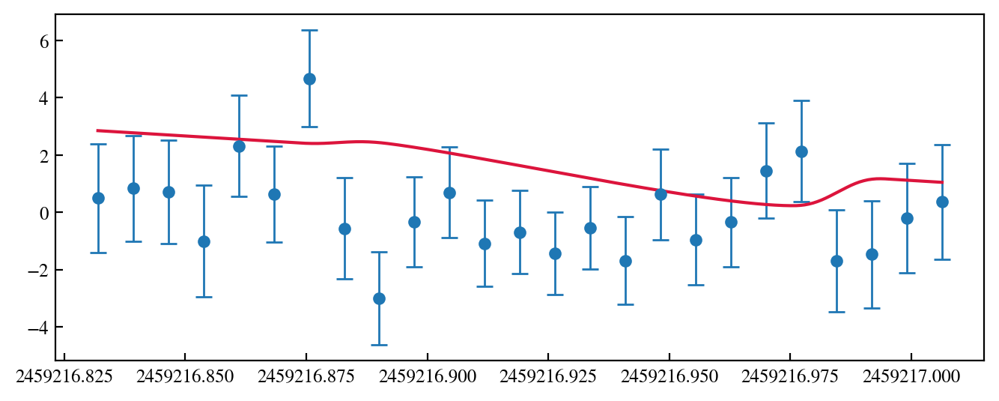

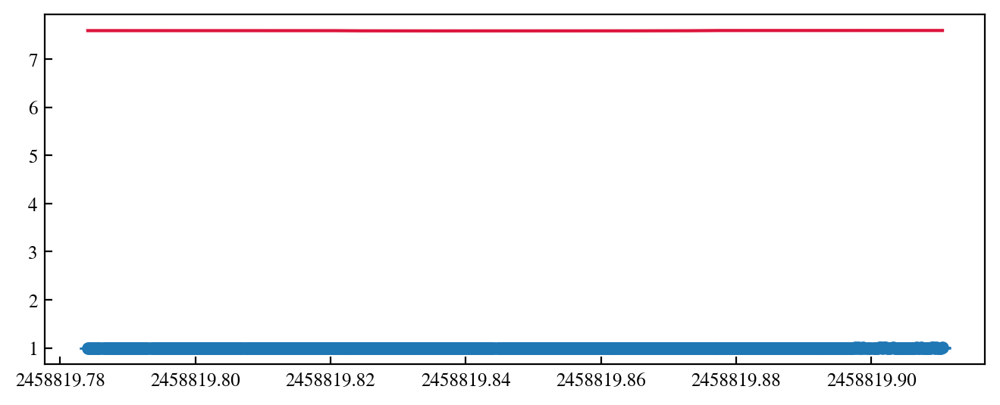

In [7]:
pv = TF.min_pv

r1,t2 = TF.lpf.compute_total_model(pv)
s1    = 0.#pv[12]
s2    = 0.#pv[13]

tt1 = np.linspace(TF.lpf.data_rv1['time'][0],TF.lpf.data_rv1['time'][-1],400)
tt2 = np.linspace(TF.lpf.data_tr1['time'][0],TF.lpf.data_tr1['time'][-1],400)
rr1, tr1 = TF.lpf.compute_total_model(pv,tt1,tt2)

fig, ax = plt.subplots(dpi=200,figsize=(8,3))
ax.errorbar(TF.lpf.data_rv1['time'],TF.lpf.data_rv1['y'],TF.lpf.data_rv1['error'],marker='o',elinewidth=1,capsize=4,lw=0,mew=1)
#ax.plot(TF.lpf.data1['time'],m1-r1,color='crimson')
ax.plot(tt1,rr1,color='crimson',ls="-")

fig, ax = plt.subplots(dpi=200,figsize=(8,3))
ax.errorbar(TF.lpf.data_tr1['time'],TF.lpf.data_tr1['y'],TF.lpf.data_tr1['error'],marker='o',elinewidth=1,capsize=4,lw=0,mew=1)
ax.plot(tt2,tr1,color='crimson',ls="-")


# MCMC 

In [8]:
f = '../data/example/05_gj3470/gj3470_priors.dat'
inp = {}
inp['time_rv1'] = df_r.bjd.values
inp['rv_rv1']   = df_r.rv.values
inp['e_rv1']    = df_r.e.values
inp['time_tr1'] = df_t.bjd.values
inp['f_tr1']    = df_t.f.values
inp['e_tr1']    = df_t.e.values

L = rmfit.rmfit.LPFunction1RM1Phot(inp,f)
TF = rmfit.rmfit.RMFit(L)
TF.minimize_PyDE(mcmc=True,mc_iter=4000,npop=60)

Reading in priorfile from ../data/example/05_gj3470/gj3470_priors.dat
   prior          arg1        arg2            label      description  \
0     NP  2.456341e+06    0.000100            t0_p1            t0_p1   
1     NP  3.336653e+00    0.000003             P_p1             P_p1   
2     UP -1.800000e+02  180.000000           lam_p1           lam_p1   
3     UP  0.000000e+00   10.000000            vsini            vsini   
4     UP  8.000000e+01   90.000000           inc_p1           inc_p1   
5     UP  0.000000e+00    0.200000             p_p1             p_p1   
6     UP  5.000000e+00   30.000000             a_p1             a_p1   
7     NP  3.500000e-01    0.100000           u1_rv1           u1_rv1   
8     NP  3.200000e-01    0.050000           u2_rv1           u2_rv1   
9     NP  3.500000e-01    0.100000           u1_tr1           u1_tr1   
10    NP  3.200000e-01    0.050000           u2_tr1           u2_tr1   
11    NP  1.250000e-01    0.042000           ecc_p1           ecc_

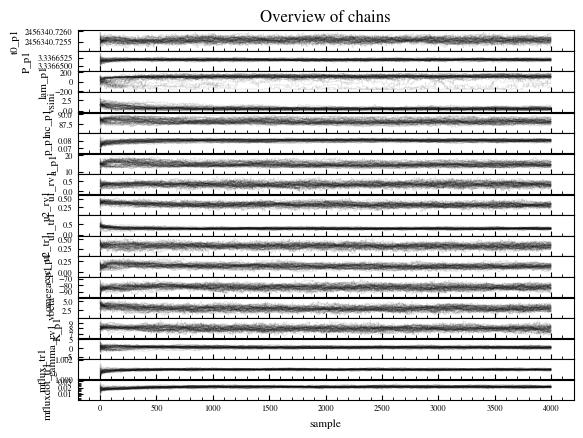

In [9]:
rmfit.mcmc_help.plot_chains(TF.sampler.chain,labels=TF.lpf.ps_vary.labels)

In [10]:
# Make flatchain and posteriors
burnin_index = 2000
chains_after_burnin = TF.sampler.chain[:,burnin_index:,:]
flatchain = chains_after_burnin.reshape((-1,len(TF.lpf.ps_vary.priors)))
df_post = pd.DataFrame(flatchain,columns=TF.lpf.ps_vary.labels)
df_post

,t0_p1,P_p1,lam_p1,vsini,inc_p1,p_p1,a_p1,u1_rv1,u2_rv1,u1_tr1,u2_tr1,ecc_p1,omega_p1,vbeta,K_p1,gamma_rv1,mflux_tr1,mfluxdot_tr1
0,2.456341e+06,3.336651,-146.221569,0.178900,87.370447,0.081993,12.524894,0.374832,0.308216,0.231366,0.275454,0.071306,-76.412107,2.463713,7.900475,-0.238427,1.000976,0.021519
1,2.456341e+06,3.336651,-146.221569,0.178900,87.370447,0.081993,12.524894,0.374832,0.308216,0.231366,0.275454,0.071306,-76.412107,2.463713,7.900475,-0.238427,1.000976,0.021519
2,2.456341e+06,3.336651,-146.221569,0.178900,87.370447,0.081993,12.524894,0.374832,0.308216,0.231366,0.275454,0.071306,-76.412107,2.463713,7.900475,-0.238427,1.000976,0.021519
3,2.456341e+06,3.336651,-163.731458,0.169027,87.317534,0.082075,12.407230,0.383297,0.304124,0.227443,0.273299,0.067757,-75.624129,2.405180,7.879024,-0.272519,1.000969,0.021363
4,2.456341e+06,3.336651,-163.731458,0.169027,87.317534,0.082075,12.407230,0.383297,0.304124,0.227443,0.273299,0.067757,-75.624129,2.405180,7.879024,-0.272519,1.000969,0.021363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119995,2.456341e+06,3.336652,79.219884,0.494980,88.034547,0.081382,14.149411,0.343033,0.275653,0.272849,0.342798,0.157833,-88.082693,2.218145,7.990814,0.533801,1.001081,0.019335
119996,2.456341e+06,3.336652,79.219884,0.494980,88.034547,0.081382,14.149411,0.343033,0.275653,0.272849,0.342798,0.157833,-88.082693,2.218145,7.990814,0.533801,1.001081,0.019335
119997,2.456341e+06,3.336652,76.730303,0.502901,88.013419,0.081609,14.121674,0.351799,0.259308,0.268214,0.344366,0.160748,-88.482592,2.025625,8.016301,0.608977,1.001099,0.019020
119998,2.456341e+06,3.336651,99.604147,0.536044,87.955807,0.081451,14.000896,0.346885,0.263766,0.268884,0.338710,0.158879,-85.833788,2.303943,8.063468,0.292364,1.001045,0.019193


In [11]:
# Assess convergence, should be close to 1 (usually within a few percent, if not, then rerun MCMC with more steps)
# This example for example would need a lot more steps, but keeping steps fewer for a quick minimal example
# Usually good to let it run for 10000 - 20000 steps for a 'production run'
rmfit.mcmc_help.gelman_rubin(chains_after_burnin)

array([1.07320214, 1.08703405, 1.52475904, 1.15304963, 1.22503517,
       1.19381699, 1.221932  , 1.12215418, 1.10985482, 1.13217893,
       1.06937923, 1.19899131, 1.13095403, 1.08229952, 1.11937005,
       1.16787091, 1.11593103, 1.08426905])

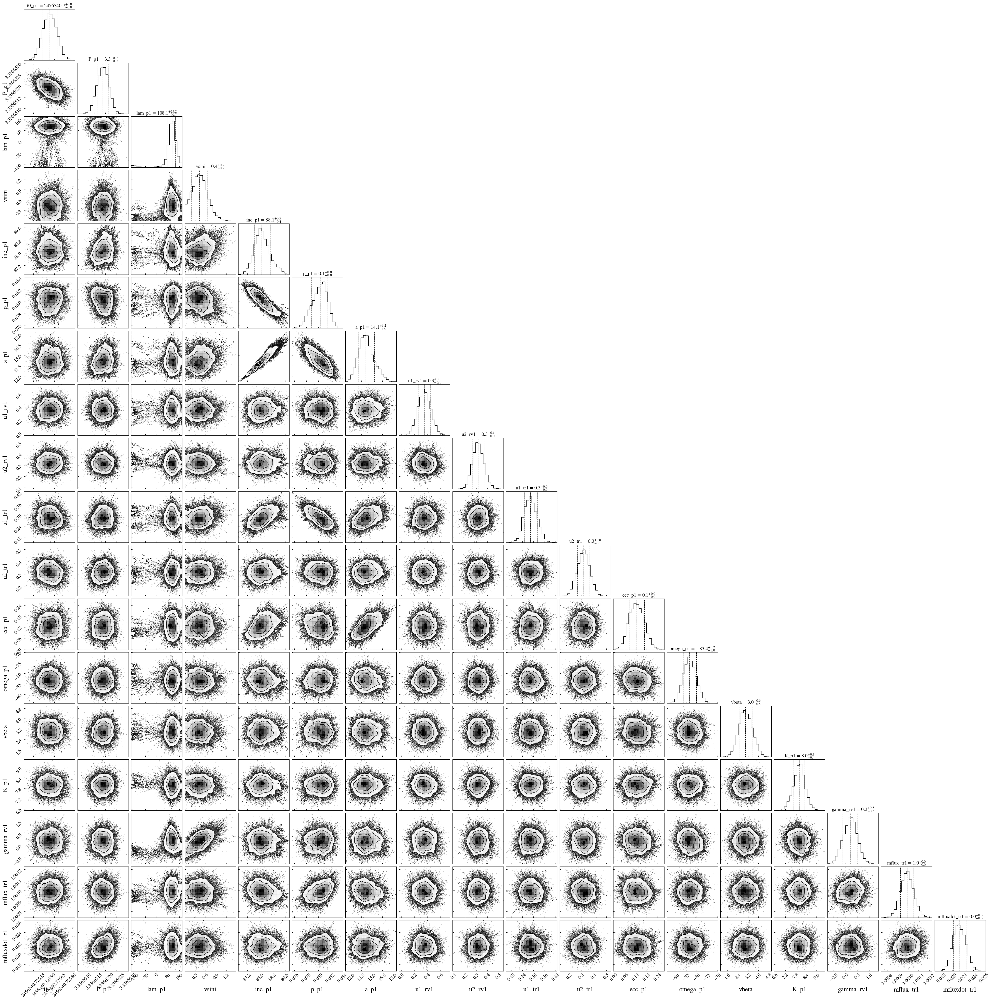

In [12]:
# Plot corner plot
fig = rmfit.mcmc_help.plot_corner(chains_after_burnin,
       show_titles=True,labels=np.array(TF.lpf.ps_vary.descriptions),title_fmt='.1f',xlabcord=(0.5, -0.2))

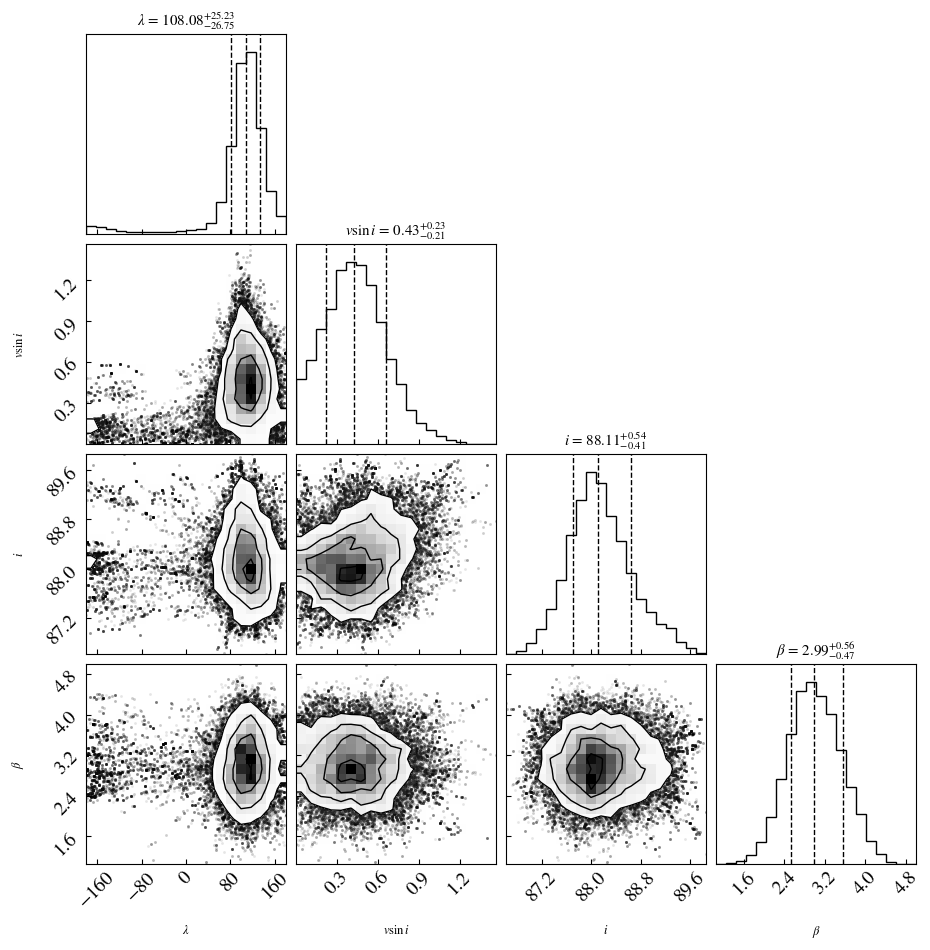

In [13]:
# Narrow down on the lambda and vsini
# without last pointt
import corner
fig = corner.corner(df_post[['lam_p1','vsini','inc_p1','vbeta']],show_titles=True,quantiles=[0.18,0.5,0.84],
                    labels=['$\lambda$','$v \sin i$','$i$',r'$\beta$'])
fig.dpi=100

In [14]:
# Check Autocorrelation
#import numpy as np
#from emcee.autocorr import integrated_time
#chain = TF.sampler.chain
#tau = np.mean([integrated_time(walker) for walker in chain], axis=0)

In [15]:
flatchain = TF.sampler.chain[:,::2000,:].reshape((-1,len(TF.lpf.ps_vary.priors)))
df_post = pd.DataFrame(flatchain,columns=TF.lpf.ps_vary.labels)

# Print median values
df_medvals = TF.get_mean_values_mcmc_posteriors(df_post.values)
df_medvals

,medvals,minus,plus,values,Labels,Description
0,2.456341e+06,1.563667e-04,1.403834e-04,$2456340.7256_{-0.00016}^{+0.00014}$,t0_p1,t0_p1
0,3.336652e+00,9.302954e-07,4.636020e-07,$3.33665174_{-0.0000009}^{+0.0000005}$,P_p1,P_p1
0,9.035675e+01,8.846533e+01,3.417632e+01,$90.0_{-88.0}^{+34.0}$,lam_p1,lam_p1
0,6.972276e-01,4.084164e-01,8.019834e-01,$0.7_{-0.41}^{+0.80}$,vsini,vsini
0,8.827144e+01,5.764674e-01,7.259804e-01,$88.27_{-0.58}^{+0.73}$,inc_p1,inc_p1
0,7.954947e-02,7.057645e-03,1.811959e-03,$0.0795_{-0.0071}^{+0.0018}$,p_p1,p_p1
0,1.437689e+01,1.333089e+00,1.373512e+00,$14.4_{-1.3}^{+1.4}$,a_p1,a_p1
0,3.293252e-01,1.129542e-01,1.502965e-01,$0.33_{-0.11}^{+0.15}$,u1_rv1,u1_rv1
0,3.635286e-01,7.899342e-02,8.303863e-02,$0.364_{-0.079}^{+0.083}$,u2_rv1,u2_rv1
0,3.218765e-01,7.049221e-02,1.018545e-01,$0.322_{-0.070}^{+0.10}$,u1_tr1,u1_tr1


# Plot Fit

Sampling, i= 0
Sampling, i= 100
Sampling, i= 200
Sampling, i= 300
Sampling, i= 400
Sampling, i= 500
Sampling, i= 600
Sampling, i= 700
Sampling, i= 800
Sampling, i= 900


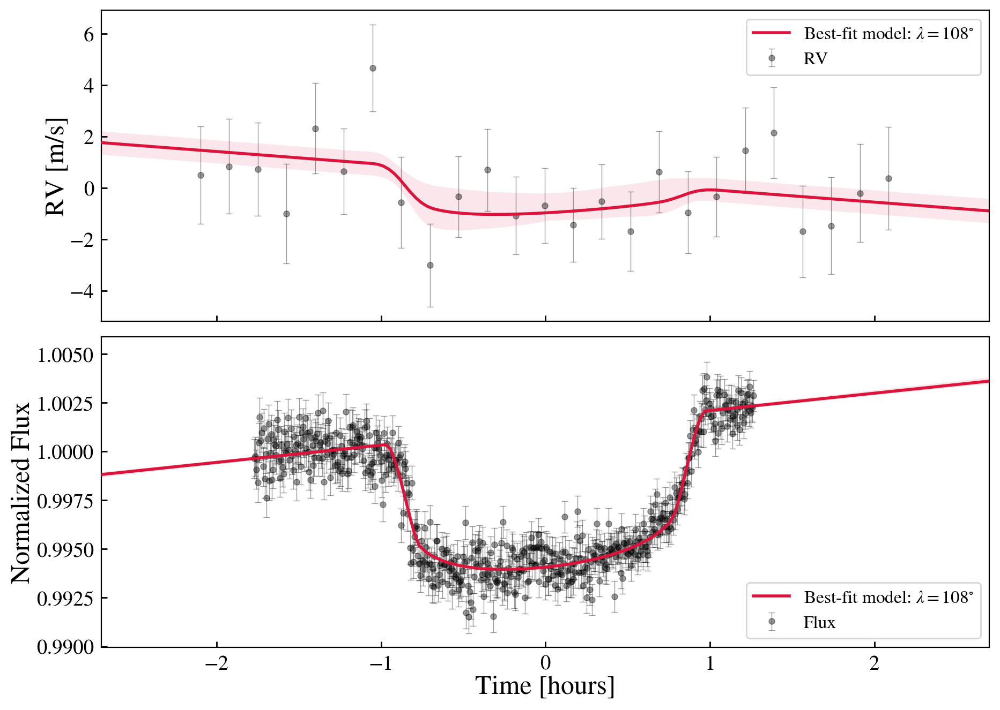

In [18]:
NBIN = 2

P = df_medvals.medvals.values[df_medvals.Labels=='P_p1'][0]
T0 = df_medvals.medvals.values[df_medvals.Labels=='t0_p1'][0]

import astropylib.exoplanet_functions as rmfit2
t01 = rmfit2.transit_time_from_ephem(inp['time_rv1'][0],P,T0)
t02 = rmfit2.transit_time_from_ephem(inp['time_tr1'][0],P,T0)

markercolor="black"
shadecolor="crimson"
ALPHA=0.4

flatchain = chains_after_burnin.reshape((-1,len(TF.lpf.ps_vary.priors)))

times1 = np.linspace(TF.lpf.data_rv1['time'][0]-0.02,TF.lpf.data_rv1['time'][-1]+0.02,500)
times2 = np.linspace(TF.lpf.data_tr1['time'][0]-0.02,TF.lpf.data_tr1['time'][-1]+0.02,500)

pv_50 = np.percentile(flatchain,[50],axis=0)[0]
s1 = 0.
s2 = 0.
t1_mod = np.linspace(times1.min()-0.1,times1.max()+0.1,300)
t2_mod = np.linspace(times2.min()-0.1,times2.max()+0.1,300)
rv_50_1, ff_50_1 = TF.lpf.compute_total_model(pv_50,times_rv1=t1_mod,times_tr1=t2_mod)

gamma1 = TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv1')
mflux = TF.lpf.get_jump_parameter_value(pv_50,'mflux_tr1')

# Plot random samples
fig, (ax,bx) = plt.subplots(nrows=2,ncols=1,dpi=200,figsize=(9,7),sharex=True)
#################
# Transit 1
#################

ax.errorbar((TF.lpf.data_rv1['time']-t01)*24,TF.lpf.data_rv1['y'],np.sqrt(TF.lpf.data_rv1['error']**2.+s1**2.),
            marker='o',elinewidth=0.5,capsize=2,lw=0,mew=0.5,color=markercolor,markersize=4,alpha=ALPHA,label='RV')
ax.plot((t1_mod-t01)*24.,rv_50_1,color="crimson",
        label=r'Best-fit model: $\lambda=${:0.0f}'.format(pv_50[2])+'$^{\circ}$',lw=2.,zorder=10)


#################
# Transit 2
#################
bx.errorbar((TF.lpf.data_tr1['time']-t02)*24,TF.lpf.data_tr1['y'],np.sqrt(TF.lpf.data_tr1['error']**2.+s2**2.),
            marker='o',elinewidth=0.5,capsize=2,lw=0,mew=0.5,color=markercolor,markersize=4,alpha=ALPHA,label='Flux')
bx.plot((t2_mod-t02)*24.,ff_50_1,color="crimson",
        label=r'Best-fit model: $\lambda=${:0.0f}'.format(pv_50[2])+'$^{\circ}$',lw=2.,zorder=10)


#################
# Sample models
#################
mmodel1 = []
mmodel2 = []
idx = np.random.choice(range(len(flatchain)),1000)
for i in range(1000):
    if i%100 == 0: print("Sampling, i=",i)
    #idx = #np.random.randint(0, flatchain.shape[0])
    m1,m2 = TF.lpf.compute_total_model(flatchain[idx[i]],times_rv1=t1_mod,times_tr1=t2_mod)
    mmodel1.append(m1)
    mmodel2.append(m2)
mmodel1 = np.array(mmodel1)
mmodel2 = np.array(mmodel2)


ax.fill_between((t1_mod-t01)*24.,np.quantile(mmodel1,0.16,axis=0),np.quantile(mmodel1,0.84,axis=0),alpha=0.1,color=shadecolor,lw=0,zorder=-1)
#ax.fill_between((t1_mod-t01)*24.,np.quantile(mmodel1,0.02,axis=0),np.quantile(mmodel1,0.98,axis=0),alpha=0.1,color=shadecolor,lw=0,label='2$\sigma$',zorder=-1)
#ax.fill_between((t1_mod-t01)*24.,np.quantile(mmodel1,0.0015,axis=0),np.quantile(mmodel1,0.9985,axis=0),alpha=0.1,color=shadecolor,lw=0,label='3$\sigma$',zorder=-1)

bx.fill_between((t2_mod-t02)*24.,np.quantile(mmodel2,0.16,axis=0),np.quantile(mmodel2,0.84,axis=0),alpha=0.1,color=shadecolor,lw=0,zorder=-1)
#bx.fill_between((t2_mod-t02)*24.,np.quantile(mmodel2,0.02,axis=0),np.quantile(mmodel2,0.98,axis=0),alpha=0.1,color=shadecolor,lw=0,label='2$\sigma$',zorder=-1)
#bx.fill_between((t2_mod-t02)*24.,np.quantile(mmodel2,0.0015,axis=0),np.quantile(mmodel2,0.9985,axis=0),alpha=0.1,color=shadecolor,lw=0,label='3$\sigma$',zorder=-1)

for xx in (ax,bx):
    #astropylib.gkastro.ax_apply_settings(xx,ticksize=16)
    xx.set_xlim(-2.7,2.7)
    #astropylib.gkastro.ax_set_linewidth(xx,1)
    xx.grid(lw=0)
    #xx.set_ylim(-14,14)
    
ax.set_ylabel("RV [m/s]",fontsize=18,labelpad=0)   
bx.set_ylabel('Normalized Flux',fontsize=18,labelpad=1)
bx.set_xlabel('Time [hours]',fontsize=18,labelpad=1)

ax.legend(loc='upper right',fontsize=12)

bx.legend(loc='lower right',fontsize=12)

fig.subplots_adjust(wspace=0.02,hspace=0.05,right=0.98,left=0.06,top=0.95,bottom=0.1)

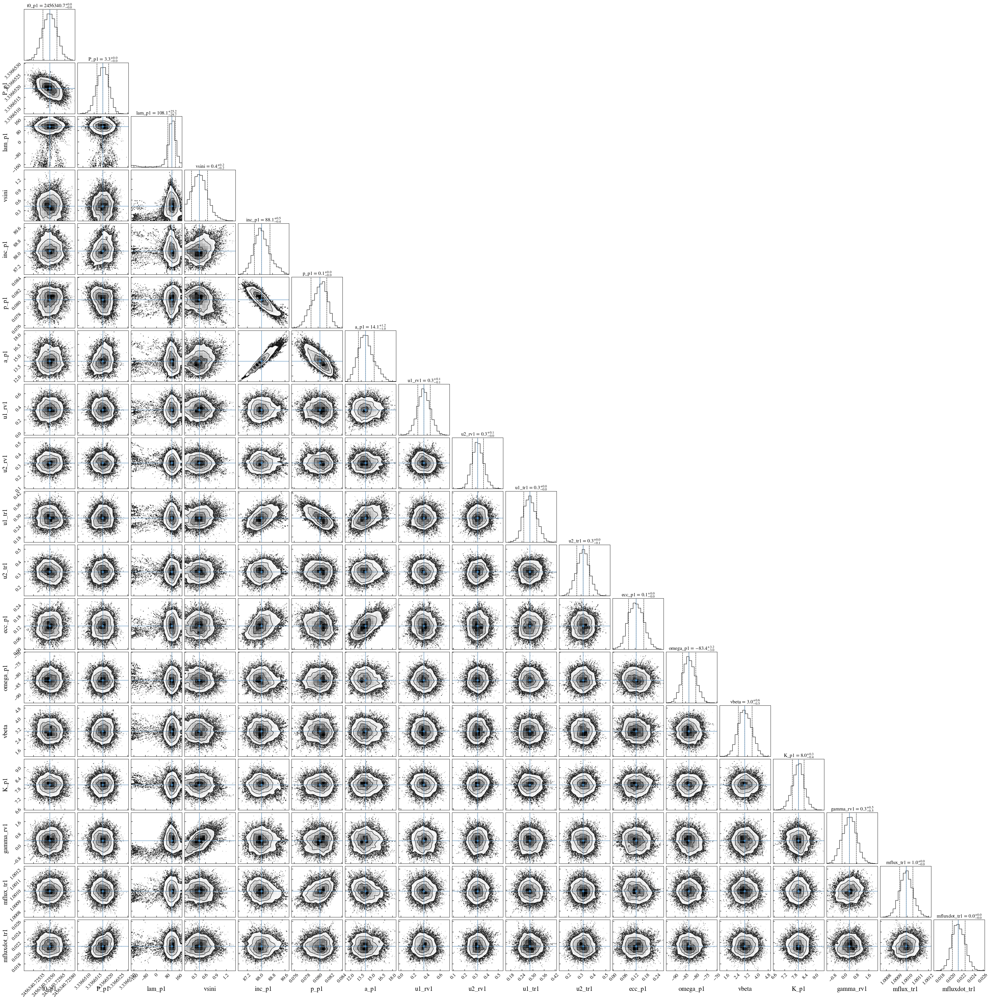

In [17]:
# Plot corner plot
fig = rmfit.mcmc_help.plot_corner(chains_after_burnin,
       show_titles=True,labels=np.array(TF.lpf.ps_vary.descriptions),title_fmt='.1f',xlabcord=(0.5, -0.2),truths=pv_50)